# **Introduction**

## **Objective**

* The objective of the data set is to **separate the human body** from the **background of the image**. You can understand it like a **background remover**.

## **Approach**

* In this case we will be using **UNet-autoencoder**(Created using **Keras and Tensorflow**).

* The **data set is quite big**, that's why loading the **whole data at once will not help**. So we will have to create a **Data Loader** that will **load the required images**.

* Instead of training the model to **actually separate human bodies** from the image, we will train it to **create masking of human bodies**. This will be an **easier** task because this will **reduce the number of channels in the output image**.

* After getting those **masked images**, we will **simply map them** to the **Real Image** in order to get the **human body out of the image background**.

* At last we will **test the model**.

## **Dataset**

* We will try to **resize the images** into **256 by 256 image size**. If that still takes the RAM, we will use the image size of **224 x 224 or 160 x 160**.

* **Batch size** will **play an important role** in deciding the uses of **RAM** so we will try to find out the **best batch size**, I personally thinks **it should be 32**.

## **Custom Objects**

* As we will be **loading only the required images**, we will need a **Custom Data Loader**.

* We also need a **preprocessing function** that can **process these images** and get the **mask out of them**.

* We will also **require a post processing function** that can use these **mask and the images** in order to get the **human body out of the background**.

* While creating **UNET**, we will create **custom layers and custom callbacks**.

---
This may seems like too much but just follow till the end and it will be easier for you to understand everything.

# **Imports**
---
Modules used throughout this notebook.

In [1]:
#  Common 
import os 
import keras
import numpy as np 
import pandas as pd
from tqdm import tqdm 
from glob import glob
import tensorflow as tf
from PIL import Image

# Data 
import cv2 as cv
from keras.preprocessing.image import img_to_array, load_img
from tensorflow.image import resize

# Data visualization
import matplotlib.pyplot as plt

# Model 
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import Dropout
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization
from keras.layers import Input
from keras.layers import concatenate

from keras.callbacks import EarlyStopping, ModelCheckpoint, Callback

# **Custom Function**
---
These are the custom functions which I used in the notebook.

In [2]:
def ShowImage(image, title=None, cmap=None):
    '''This function takes image, title and cmap as the input and plot the image. With the respective configuration.'''
    plt.imshow(image, cmap=cmap)
    if title is not None : plt.title(title)
    plt.axis('off')

In [3]:
def data_loader(image_df, matting_df, IMAGE_SIZE=256, BATCH_SIZE=64, channels =[3,1]):
    '''
    In simple words, this function takes in the image data frame and the matching data frame and selects
    random images with the help of Numpy permutation of the batch size. 
    
    Then it loads that image converted to a Numpy array, resize the image and finally create the mask out
    of the matting and return the image, matting and the mask.
    
    '''
    
    idxs = np.random.permutation(len(image_df))[:BATCH_SIZE]

    images = np.zeros(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, channels[0]))
    mattings = np.zeros(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, channels[0]))
    masks = np.zeros(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, channels[1]))

    for i, id in enumerate(idxs):
        image_path = root_img + "/" + image_df["Folder_ID"][id] + "/" + image_df["Clip_ID"][id] + '/' + image_df["Image_ID"][id]
        matting_path = root_mask + "/" + matting_df["Folder_ID"][id] + "/" + matting_df["Matting_ID"][id] + '/' + matting_df["Image_ID"][id]

        image = resize(img_to_array(load_img(image_path))/255., (IMAGE_SIZE, IMAGE_SIZE)).numpy()
        matting = resize(img_to_array(load_img(matting_path))/255.,(IMAGE_SIZE, IMAGE_SIZE)).numpy()
        mask = (matting>0).astype('float')

        images[i] = image
        mattings[i] = matting
        masks[i] = mask[:,:,:1]
    return images, mattings, masks

In [4]:
def map(image,mask,th):
    '''
    This function takes in the image and the mask (produced by the model).
    And produce matting out of this image and mask using the Numpy "where" function.
    '''
    return np.where(mask>th,image,mask)

In [5]:
def Learning_Curve(data):
    '''
    Takes in the results generated by the model training and plot them
    '''
    pd.DataFrame(data.history).plot(figsize=(8,5))
    plt.grid()
    plt.show()

In [6]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs):
        plt.figure(figsize=(15,8))
        image, _, mask = data_loader(image_df, matting_df, BATCH_SIZE=1, IMAGE_SIZE=224)
        pred_mask = self.model.predict(image)[0]
        mapping = map(image, pred_mask, 0.5)[0]

        plt.subplot(1,4,1)
        ShowImage(image[0],title="True Image")
    
        plt.subplot(1,4,2)
        ShowImage(pred_mask, title="Predicted Mask", cmap='gray')
    
        plt.subplot(1,4,3)
        ShowImage(mask[0].reshape(IMAGE_SIZE, IMAGE_SIZE), title="True Mask", cmap='gray')
    
        plt.subplot(1,4,4)
        ShowImage(mapping, title="Mapped Image")
    
        plt.tight_layout()
        plt.show()

# **Data**
---
Having a look at the data and trying to understand it.

In [7]:
image_df = pd.DataFrame(columns=["Folder_ID","Clip_ID","Image_ID"], index=range(34427))
matting_df = pd.DataFrame(columns=["Folder_ID","Matting_ID","Image_ID"], index=range(34427))

As the data is distributed into **multiple subdirectories**, we will have to go in into all the **directories and gather the images sequentially**.

In [9]:
root = "D:\\Casper\\OTHER\\Data\\mattings-human-DatasetNinja\\ds"
root_img = f'{root}\\img'
root_mask = f'{root}\\ann'

image_folders = sorted(os.listdir(root_img))
matting_folders = sorted(os.listdir(root_mask))

In [12]:
print(image_folders)

['1803151818-00000003.jpg', '1803151818-00000004.jpg', '1803151818-00000006.jpg', '1803151818-00000007.jpg', '1803151818-00000008.jpg', '1803151818-00000009.jpg', '1803151818-00000010.jpg', '1803151818-00000012.jpg', '1803151818-00000015.jpg', '1803151818-00000017.jpg', '1803151818-00000020.jpg', '1803151818-00000021.jpg', '1803151818-00000022.jpg', '1803151818-00000023.jpg', '1803151818-00000024.jpg', '1803151818-00000025.jpg', '1803151818-00000026.jpg', '1803151818-00000030.jpg', '1803151818-00000041.jpg', '1803151818-00000042.jpg', '1803151818-00000043.jpg', '1803151818-00000045.jpg', '1803151818-00000046.jpg', '1803151818-00000047.jpg', '1803151818-00000048.jpg', '1803151818-00000051.jpg', '1803151818-00000052.jpg', '1803151818-00000053.jpg', '1803151818-00000054.jpg', '1803151818-00000060.jpg', '1803151818-00000061.jpg', '1803151818-00000062.jpg', '1803151818-00000065.jpg', '1803151818-00000066.jpg', '1803151818-00000069.jpg', '1803151818-00000074.jpg', '1803151818-00000076.jpg', 

In [11]:
clip_image_dirs = [sorted(os.listdir(root_img + '/' + folder)) for folder in image_folders]
clip_matting_dirs = [sorted(os.listdir(root_mask + '/' + folder)) for folder in matting_folders]

NotADirectoryError: [WinError 267] 目錄名稱無效。: 'D:\\Casper\\OTHER\\Data\\mattings-human-DatasetNinja\\ds\\img\\1803151818-00000003.jpg'

In [10]:
%%time
k=0
for i,folder in enumerate(image_folders):
    for clip in clip_image_dirs[i]:
        for image_id in os.listdir(root_img + '/' + folder + '/' + clip):
            
            image_df["Folder_ID"][k] = folder
            image_df['Clip_ID'][k] = clip
            image_df["Image_ID"][k] = image_id
            
            matting_df["Folder_ID"][k] = folder
            matting_id = clip.split('_')[-1]
            matting_df["Matting_ID"][k] = "matting_" + matting_id # the clip ID is changed to matting ID.
            image_id = image_id.split(".")[0]
            matting_df["Image_ID"][k] = image_id + ".png" # the mating images are in PNG format.
            k+=1

CPU times: user 41.1 s, sys: 236 ms, total: 41.3 s
Wall time: 45.3 s


In [11]:
image_df.head()

,Folder_ID,Clip_ID,Image_ID
0,1803151818,clip_00000000,1803151818-00000062.jpg
1,1803151818,clip_00000000,1803151818-00000465.jpg
2,1803151818,clip_00000000,1803151818-00000314.jpg
3,1803151818,clip_00000000,1803151818-00000681.jpg
4,1803151818,clip_00000000,1803151818-00000594.jpg


In [12]:
matting_df.head()

,Folder_ID,Matting_ID,Image_ID
0,1803151818,matting_00000000,1803151818-00000062.png
1,1803151818,matting_00000000,1803151818-00000465.png
2,1803151818,matting_00000000,1803151818-00000314.png
3,1803151818,matting_00000000,1803151818-00000681.png
4,1803151818,matting_00000000,1803151818-00000594.png


In [13]:
image_df.isnull().sum()

Folder_ID    0
Clip_ID      0
Image_ID     0
dtype: int64

You can understand these data frames as the **path of the images mapped into a data frame**. Let's check if the exact same row in the image data frame and the matting data frame represents the same image or not.

In [14]:
row_id = np.random.randint(len(image_df))  #Random 
print(image_df.iloc[row_id])
print("\n")
print(matting_df.iloc[row_id])

Folder_ID                 1803151818
Clip_ID                clip_00000021
Image_ID     1803151818-00021232.jpg
Name: 9420, dtype: object


Folder_ID                  1803151818
Matting_ID           matting_00000021
Image_ID      1803151818-00021232.png
Name: 9420, dtype: object


OK, so the name of the folder, the clip folder and the final image looks the same. Let's see them visually.

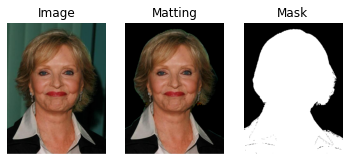

In [15]:
image_path = root_img + "/" + image_df["Folder_ID"][row_id] + "/" + image_df["Clip_ID"][row_id] + '/' + image_df["Image_ID"][row_id]
image = img_to_array(load_img(image_path))/255.

matting_path = root_mask + "/" + matting_df["Folder_ID"][row_id] + "/" + matting_df["Matting_ID"][row_id] + '/' + matting_df["Image_ID"][row_id]
matting = img_to_array(load_img(matting_path))/255.

mask = (matting[:,:,0]>0).astype('float')

plt.subplot(1,3,1)
ShowImage(image, title="Image")
plt.subplot(1,3,2)
ShowImage(matting, title="Matting")
plt.subplot(1,3,3)
ShowImage(mask, title="Mask", cmap='gray')

The data loader function that I have created in the custom functions is based on the above cell code. You can check it out there. Let's use that data loader and load some images from the data set.

In [16]:
images, mattings, masks = data_loader(image_df, matting_df, IMAGE_SIZE=224, BATCH_SIZE=5)

2022-08-27 12:02:18.029964: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-27 12:02:18.135198: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-27 12:02:18.135932: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-27 12:02:18.138114: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

The profit of this data loader function is that each time it produces random images.

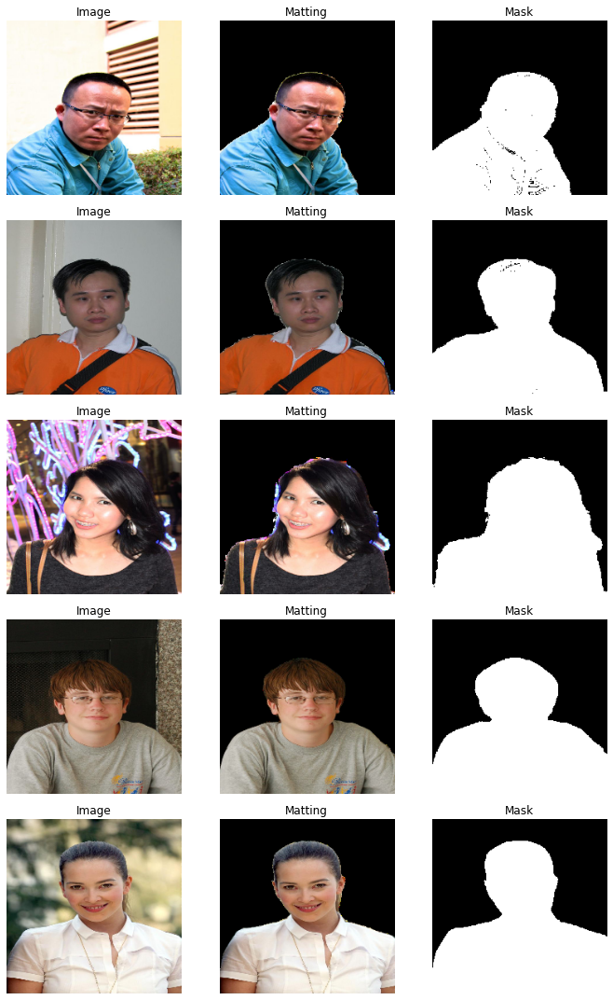

In [17]:
plt.figure(figsize=(10,15))
n=0
k = 0
for i in range(1,16):
    plt.subplot(5,3,i)
    
    if n==0:
        image = images[k].astype('float')
        matting = mattings[k]
        mask = masks[k]
        ShowImage(image, title="Image")
        k+=1
        n+=1
    elif n==1:
        ShowImage(matting, title="Matting")
        n+=1
    elif n==2:
        ShowImage(mask, title="Mask", cmap='gray')
        n=0
plt.tight_layout()
plt.show()

As you can see that masking sometimes fails and produces black dots in between of a white mask. I think, model will be able to tackle it and it will fill those gaps easily. Let's change image to matting by using the original image and the mask(Which in future will be produced by the model).

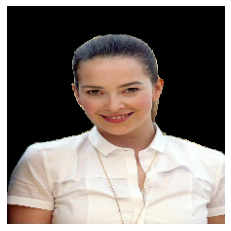

In [18]:
img = map(image, mask, 0)
ShowImage(img)

So now you have the idea how we are going to load these data at the time of the training. And feed it to the network, then produce the mask and post process it to produce the matting.

# **Model**
---
Coding the UNet-AutoEncoder architecture using Functional API and Custom Layers.

In [19]:
# Encoder Layer 
class EncoderLayerBlock(Layer):
    def __init__(self, filters, rate, pooling=True):
        super(EncoderLayerBlock, self).__init__()
        self.filters = filters
        self.rate = rate
        self.pooling = pooling
    
        self.c1 = Conv2D(self.filters, kernel_size=3, padding='same', activation='selu', kernel_initializer='he_normal')
        self.drop = Dropout(self.rate)
        self.c2 = Conv2D(self.filters, kernel_size=3, padding='same', activation='selu', kernel_initializer='he_normal')
        self.pool = MaxPool2D(pool_size=(2,2))

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else: 
            return x

    def get_config(self):
        base_estimator = super().get_config()
        return {
            **base_estimator,
            "filters":self.filters,
            "rate":self.rate,
            "pooling":self.pooling
        }

#  Decoder Layer
class DecoderLayerBlock(Layer):
    def __init__(self, filters, rate):
        super(DecoderLayerBlock, self).__init__()
        self.filters = filters
        self.rate = rate
        self.cT = Conv2DTranspose(self.filters, kernel_size=3, strides=2, padding='same')
        self.next = EncoderLayerBlock(self.filters, self.rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.cT(X)
        c1 = concatenate([x, skip_X])
        y = self.next(c1)
        return y 

    def get_config(self):
        base_estimator = super().get_config()
        return {
            **base_estimator,
            "filters":self.filters,
            "rate":self.rate,
        }

I hopw these layer blocks are clear to you because this are nothing but just the **UNet autoencoder Architecture in a better format.**

In [20]:
%%time
X_train, _, y_train = data_loader(image_df,matting_df,224,1000) 

CPU times: user 31 s, sys: 1.96 s, total: 33 s
Wall time: 42.4 s


In [21]:
%%time
X_valid, _, y_valid = data_loader(image_df,matting_df,224,500) 

CPU times: user 17.8 s, sys: 1.11 s, total: 18.9 s
Wall time: 24 s


You can try out the image size of 256 X 256. But **224 X 224** worked for me with a **decent time**, that's why I kept it. You may think that **1000 images** is an **extremely low count** for the model to learn, but **in practice** what I found is **the model is still able to learn mapping decently**.

One important thing that I wanted to mention is that there is **no trade off** between the **image size and the total number of images** to be loaded because the images are **reshaped after loading, not before loading**. Everything depends upon the **total number of images**.


But keep in mind that the RAM is also affected by the **image size** because **bigger the size**, the more RAM it used by the **model in training**.

---
You can increase the total number as per your RAM. Just make sure that you don't run out of RAM.

2022-08-27 12:03:30.921283: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/100


2022-08-27 12:03:33.893613: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


32/32 [==============================] - 17s 232ms/step - loss: 0.6582 - accuracy: 0.6732 - IoU: 0.2189 - val_loss: 0.4514 - val_accuracy: 0.8161 - val_IoU: 0.2181


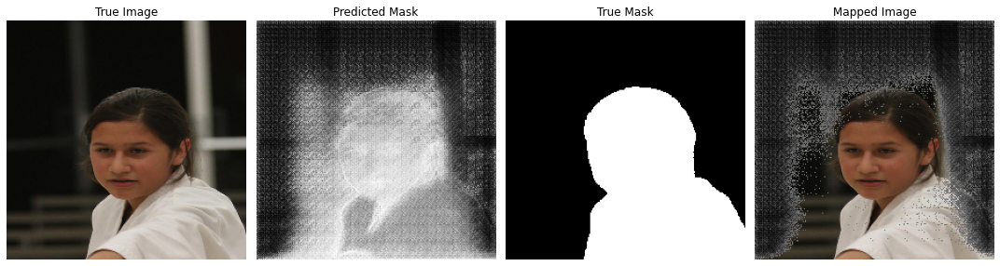

Epoch 2/100
32/32 [==============================] - 5s 162ms/step - loss: 0.4297 - accuracy: 0.8147 - IoU: 0.2189 - val_loss: 0.7186 - val_accuracy: 0.6978 - val_IoU: 0.2181


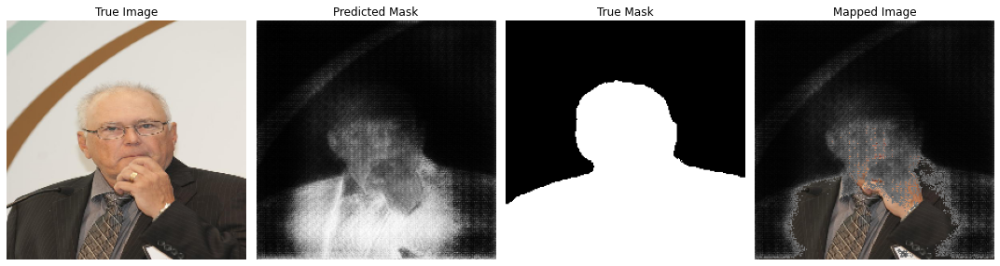

Epoch 3/100
32/32 [==============================] - 5s 161ms/step - loss: 0.3411 - accuracy: 0.8629 - IoU: 0.2189 - val_loss: 0.5552 - val_accuracy: 0.7790 - val_IoU: 0.2181


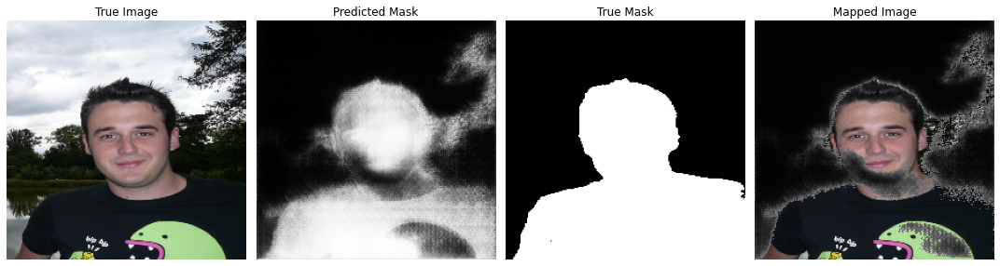

Epoch 4/100
32/32 [==============================] - 5s 147ms/step - loss: 0.3078 - accuracy: 0.8775 - IoU: 0.2189 - val_loss: 0.4201 - val_accuracy: 0.8129 - val_IoU: 0.2181


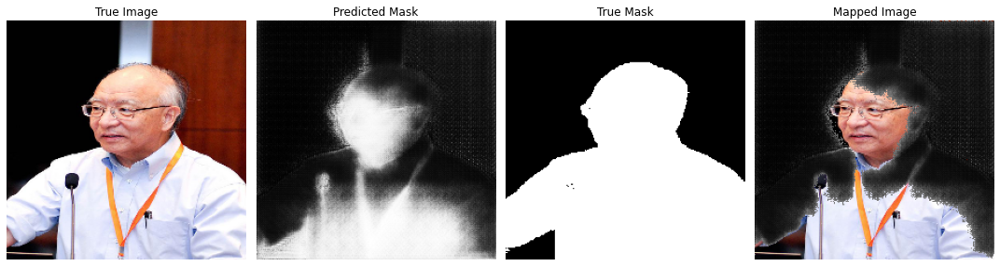

Epoch 5/100
32/32 [==============================] - 5s 143ms/step - loss: 0.2752 - accuracy: 0.8923 - IoU: 0.2189 - val_loss: 0.3103 - val_accuracy: 0.8746 - val_IoU: 0.2181


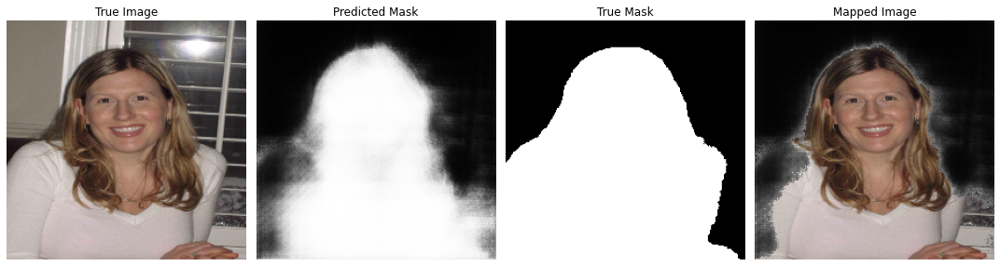

Epoch 6/100
32/32 [==============================] - 5s 162ms/step - loss: 0.2476 - accuracy: 0.9039 - IoU: 0.2189 - val_loss: 0.3820 - val_accuracy: 0.8489 - val_IoU: 0.2181


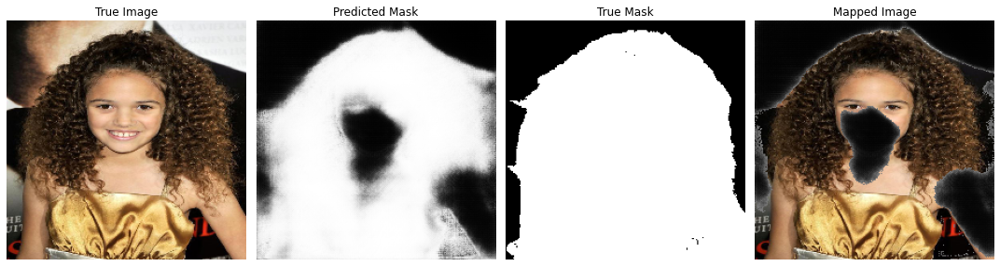

Epoch 7/100
32/32 [==============================] - 5s 144ms/step - loss: 0.2304 - accuracy: 0.9114 - IoU: 0.2189 - val_loss: 0.2731 - val_accuracy: 0.8951 - val_IoU: 0.2181


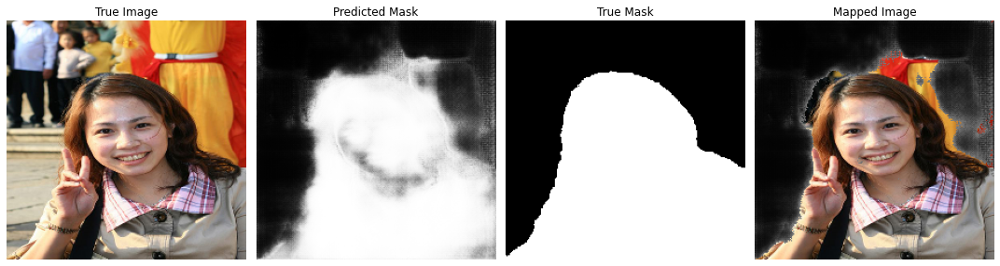

Epoch 8/100
32/32 [==============================] - 5s 161ms/step - loss: 0.2291 - accuracy: 0.9112 - IoU: 0.2189 - val_loss: 0.3744 - val_accuracy: 0.8759 - val_IoU: 0.2181


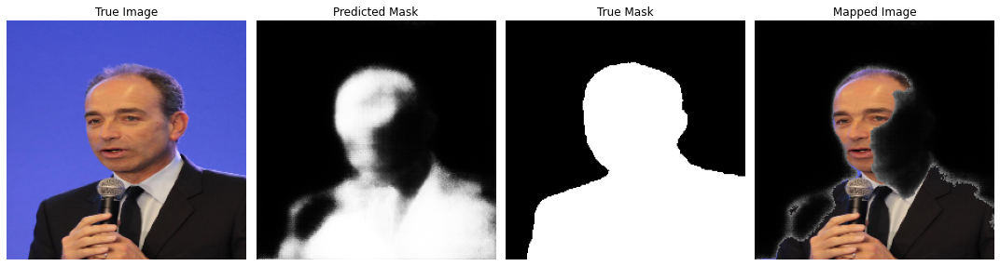

Epoch 9/100
32/32 [==============================] - 5s 144ms/step - loss: 0.2009 - accuracy: 0.9245 - IoU: 0.2189 - val_loss: 0.2697 - val_accuracy: 0.8937 - val_IoU: 0.2181


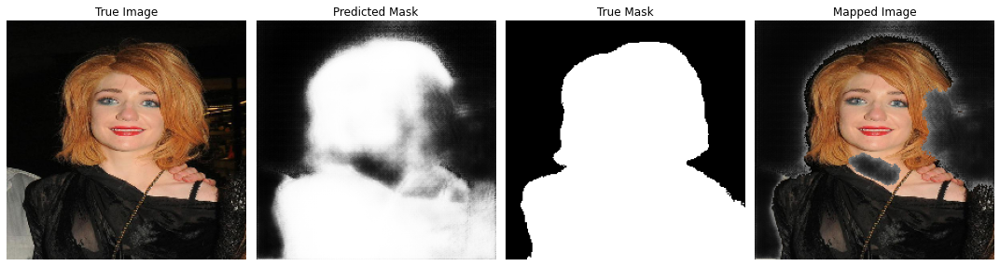

Epoch 10/100
32/32 [==============================] - 5s 145ms/step - loss: 0.1890 - accuracy: 0.9293 - IoU: 0.2189 - val_loss: 0.3467 - val_accuracy: 0.8624 - val_IoU: 0.2181


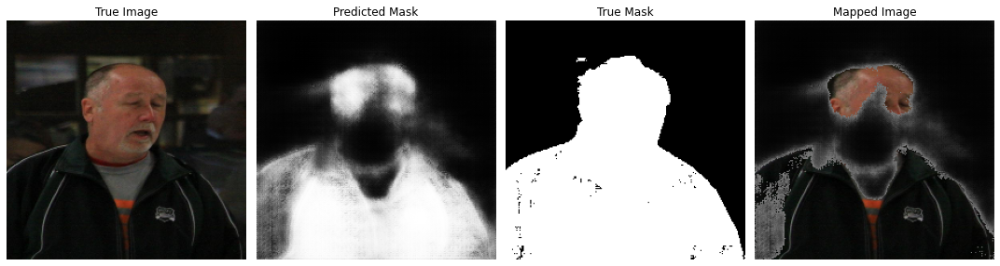

Epoch 11/100
32/32 [==============================] - 5s 144ms/step - loss: 0.1920 - accuracy: 0.9291 - IoU: 0.2190 - val_loss: 0.2954 - val_accuracy: 0.8857 - val_IoU: 0.2181


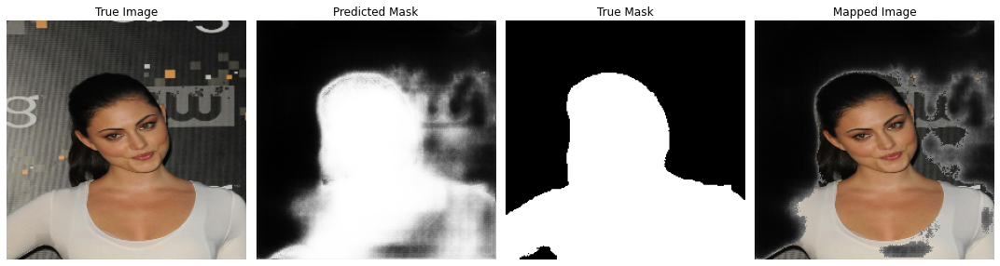

Epoch 12/100
32/32 [==============================] - 5s 147ms/step - loss: 0.1679 - accuracy: 0.9379 - IoU: 0.2190 - val_loss: 0.2268 - val_accuracy: 0.9169 - val_IoU: 0.2181


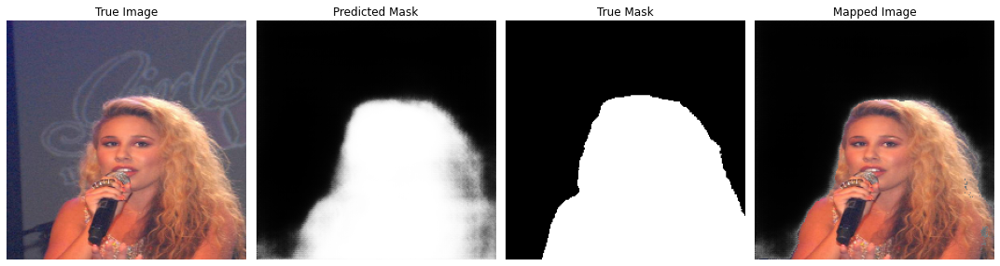

Epoch 13/100
32/32 [==============================] - 5s 145ms/step - loss: 0.1597 - accuracy: 0.9419 - IoU: 0.2190 - val_loss: 0.2677 - val_accuracy: 0.9090 - val_IoU: 0.2181


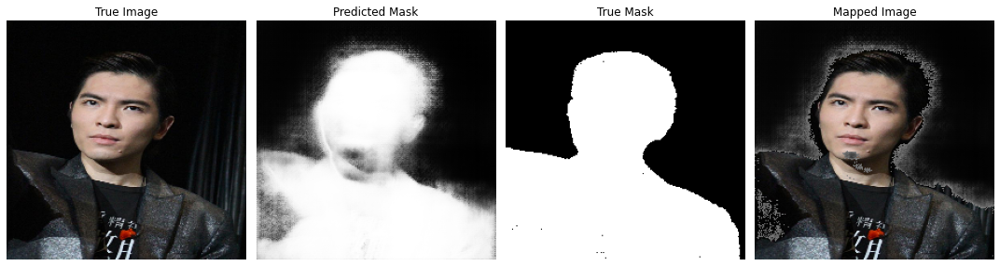

Epoch 14/100
32/32 [==============================] - 5s 143ms/step - loss: 0.1573 - accuracy: 0.9432 - IoU: 0.2190 - val_loss: 0.2044 - val_accuracy: 0.9280 - val_IoU: 0.2181


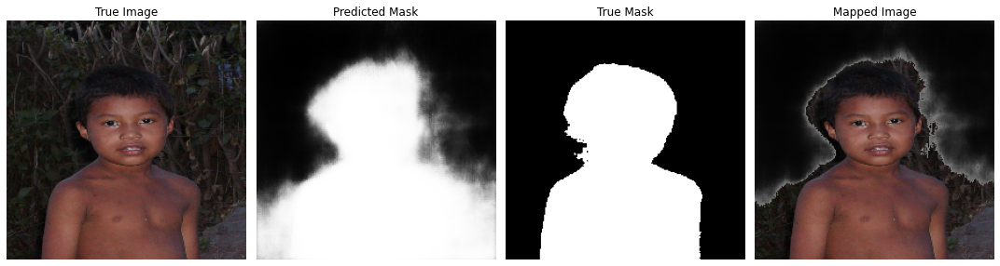

Epoch 15/100
32/32 [==============================] - 5s 146ms/step - loss: 0.1494 - accuracy: 0.9461 - IoU: 0.2190 - val_loss: 0.1999 - val_accuracy: 0.9337 - val_IoU: 0.2181


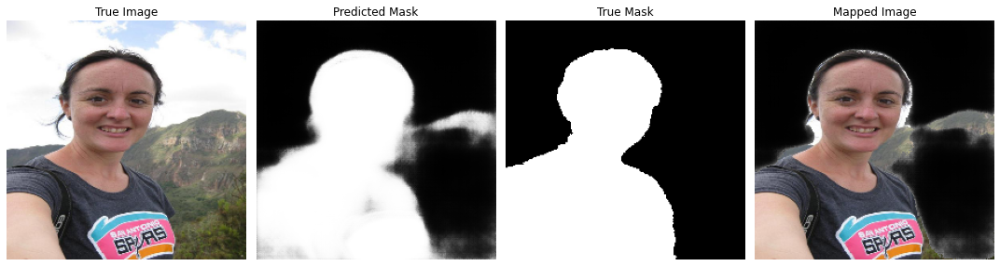

Epoch 16/100
32/32 [==============================] - 5s 161ms/step - loss: 0.1343 - accuracy: 0.9523 - IoU: 0.2190 - val_loss: 0.1820 - val_accuracy: 0.9370 - val_IoU: 0.2181


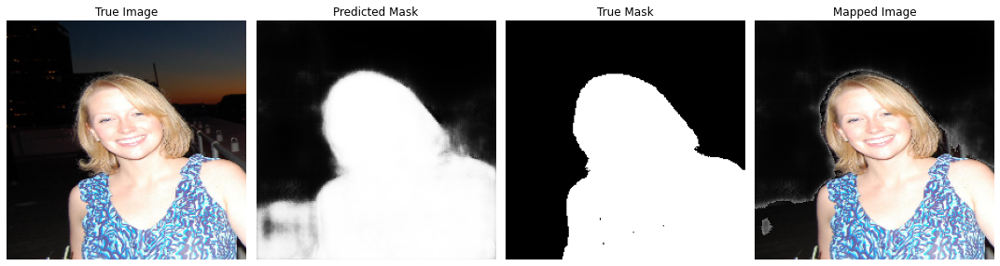

Epoch 17/100
32/32 [==============================] - 5s 145ms/step - loss: 0.1320 - accuracy: 0.9528 - IoU: 0.2190 - val_loss: 0.1886 - val_accuracy: 0.9356 - val_IoU: 0.2181


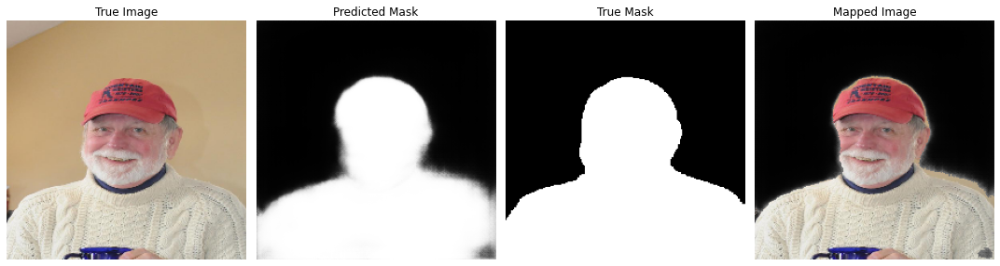

Epoch 18/100
32/32 [==============================] - 5s 147ms/step - loss: 0.1238 - accuracy: 0.9563 - IoU: 0.2190 - val_loss: 0.1720 - val_accuracy: 0.9430 - val_IoU: 0.2181


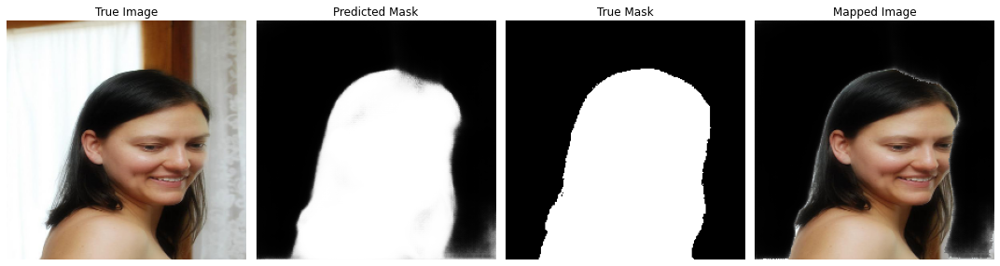

Epoch 19/100
32/32 [==============================] - 5s 144ms/step - loss: 0.1226 - accuracy: 0.9570 - IoU: 0.2190 - val_loss: 0.1797 - val_accuracy: 0.9411 - val_IoU: 0.2181


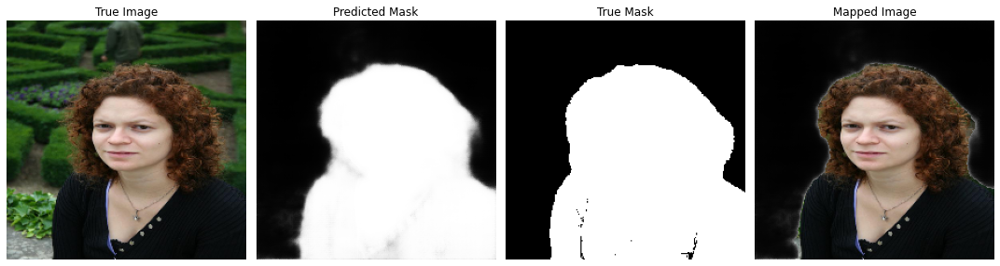

Epoch 20/100
32/32 [==============================] - 5s 162ms/step - loss: 0.1136 - accuracy: 0.9595 - IoU: 0.2190 - val_loss: 0.1739 - val_accuracy: 0.9418 - val_IoU: 0.2181


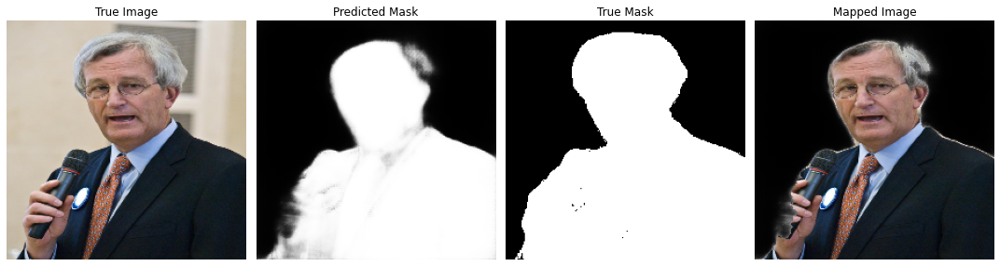

Epoch 21/100
32/32 [==============================] - 5s 145ms/step - loss: 0.1177 - accuracy: 0.9586 - IoU: 0.2190 - val_loss: 0.1826 - val_accuracy: 0.9418 - val_IoU: 0.2181


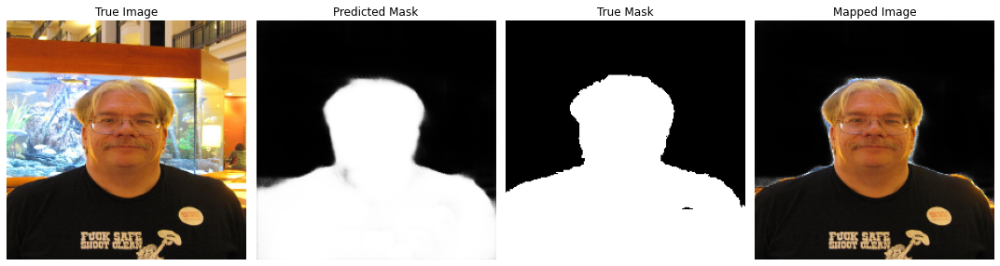

Epoch 22/100
32/32 [==============================] - 5s 144ms/step - loss: 0.1082 - accuracy: 0.9623 - IoU: 0.2190 - val_loss: 0.1669 - val_accuracy: 0.9433 - val_IoU: 0.2181


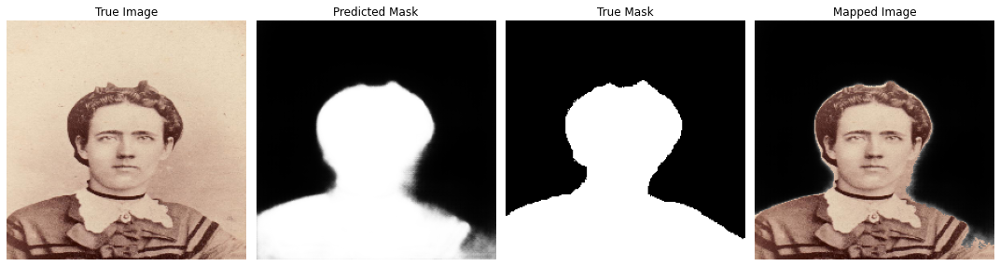

Epoch 23/100
32/32 [==============================] - 5s 162ms/step - loss: 0.1071 - accuracy: 0.9625 - IoU: 0.2192 - val_loss: 0.1998 - val_accuracy: 0.9402 - val_IoU: 0.2181


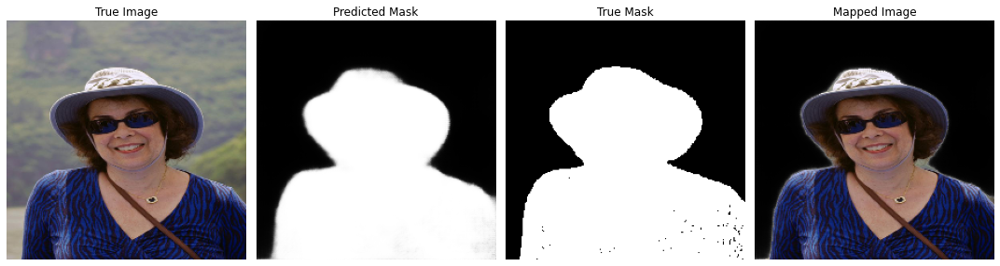

Epoch 24/100
32/32 [==============================] - 5s 143ms/step - loss: 0.0992 - accuracy: 0.9652 - IoU: 0.2191 - val_loss: 0.1736 - val_accuracy: 0.9495 - val_IoU: 0.2181


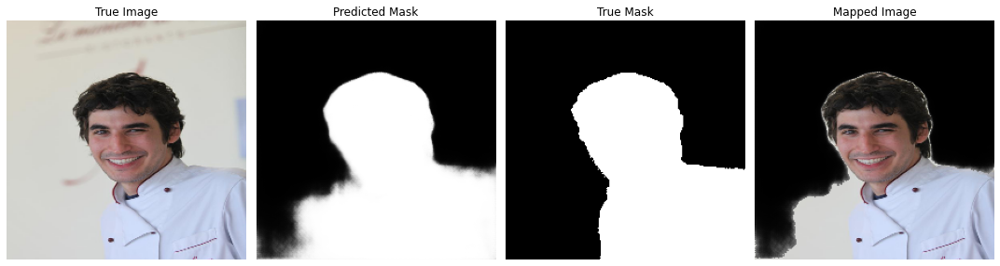

Epoch 25/100
32/32 [==============================] - 5s 144ms/step - loss: 0.0943 - accuracy: 0.9674 - IoU: 0.2190 - val_loss: 0.1765 - val_accuracy: 0.9441 - val_IoU: 0.2181


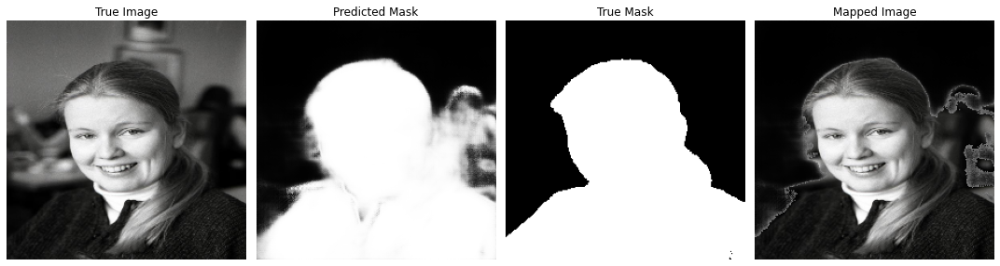

Epoch 26/100
32/32 [==============================] - 5s 146ms/step - loss: 0.1209 - accuracy: 0.9581 - IoU: 0.2196 - val_loss: 0.1543 - val_accuracy: 0.9513 - val_IoU: 0.2181


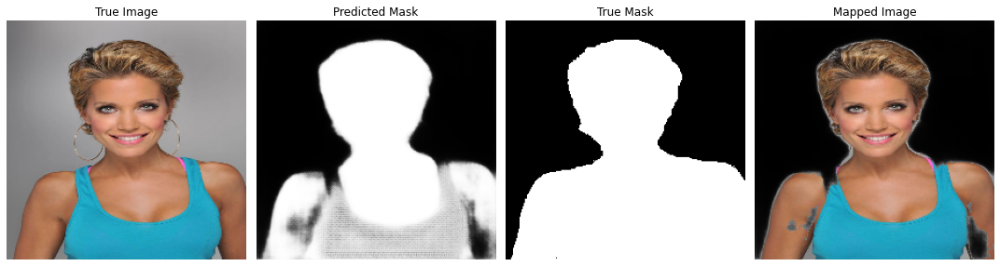

Epoch 27/100
32/32 [==============================] - 5s 145ms/step - loss: 0.1021 - accuracy: 0.9643 - IoU: 0.2190 - val_loss: 0.1547 - val_accuracy: 0.9510 - val_IoU: 0.2181


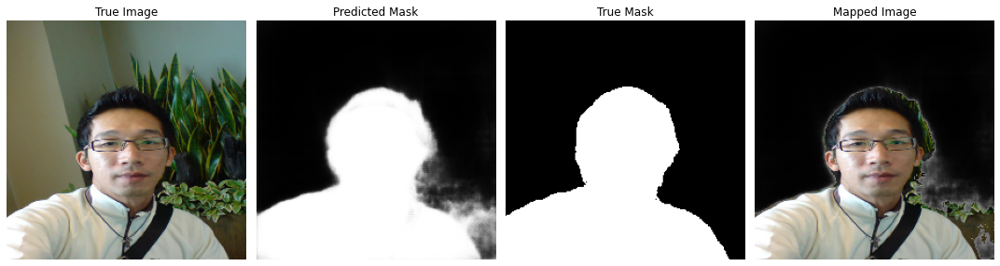

Epoch 28/100
32/32 [==============================] - 5s 144ms/step - loss: 0.0928 - accuracy: 0.9680 - IoU: 0.2190 - val_loss: 0.1526 - val_accuracy: 0.9537 - val_IoU: 0.2181


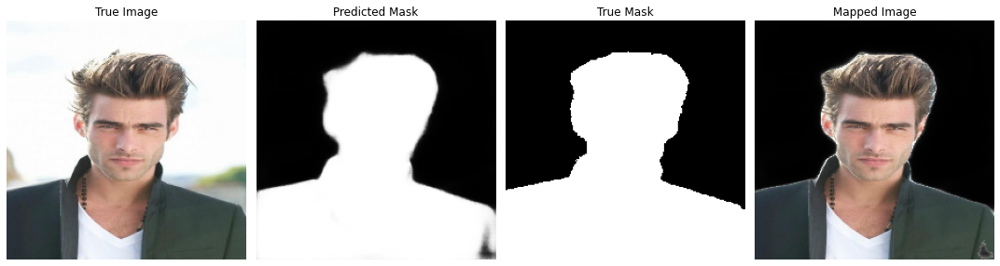

Epoch 29/100
32/32 [==============================] - 5s 162ms/step - loss: 0.0858 - accuracy: 0.9701 - IoU: 0.2190 - val_loss: 0.1526 - val_accuracy: 0.9540 - val_IoU: 0.2181


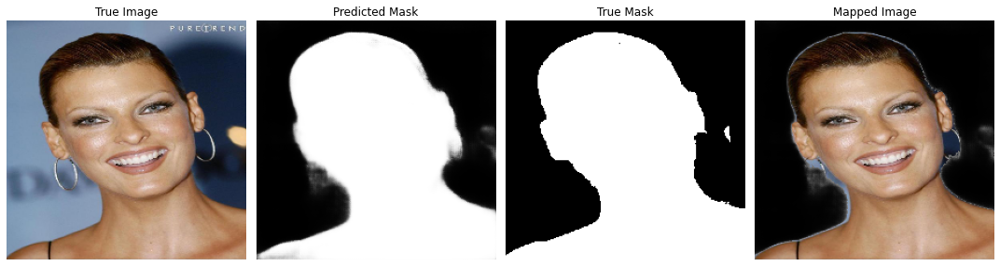

Epoch 30/100
32/32 [==============================] - 5s 143ms/step - loss: 0.0878 - accuracy: 0.9694 - IoU: 0.2190 - val_loss: 0.1383 - val_accuracy: 0.9536 - val_IoU: 0.2181


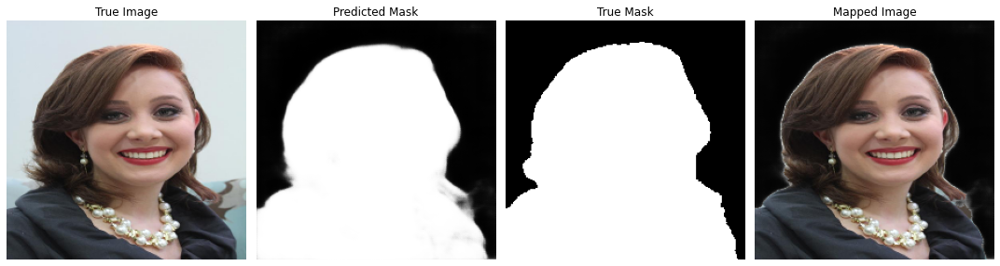

Epoch 31/100
32/32 [==============================] - 5s 161ms/step - loss: 0.0818 - accuracy: 0.9715 - IoU: 0.2193 - val_loss: 0.1566 - val_accuracy: 0.9543 - val_IoU: 0.2181


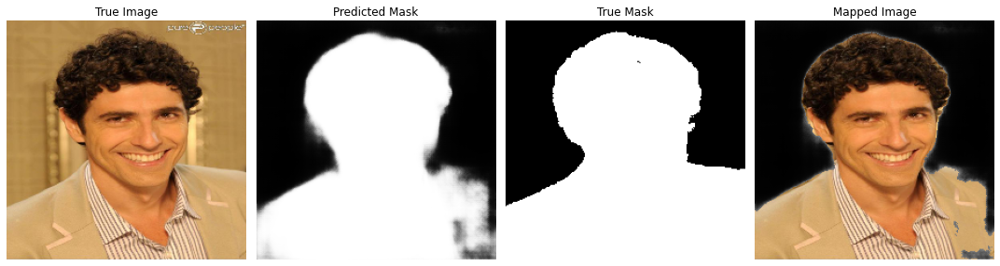

Epoch 32/100
32/32 [==============================] - 5s 164ms/step - loss: 0.0760 - accuracy: 0.9734 - IoU: 0.2194 - val_loss: 0.1526 - val_accuracy: 0.9550 - val_IoU: 0.2181


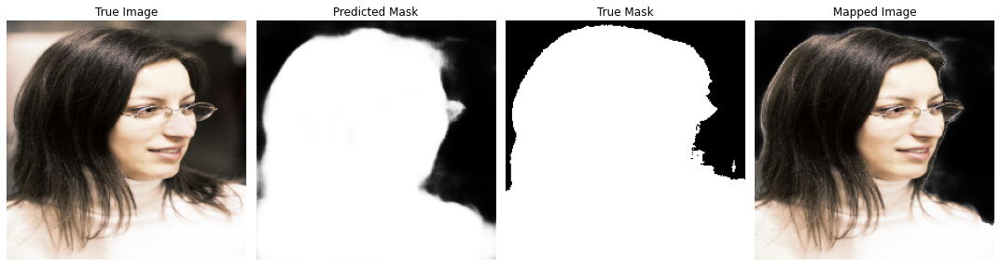

Epoch 33/100
32/32 [==============================] - 5s 144ms/step - loss: 0.0702 - accuracy: 0.9750 - IoU: 0.2190 - val_loss: 0.1581 - val_accuracy: 0.9562 - val_IoU: 0.2181


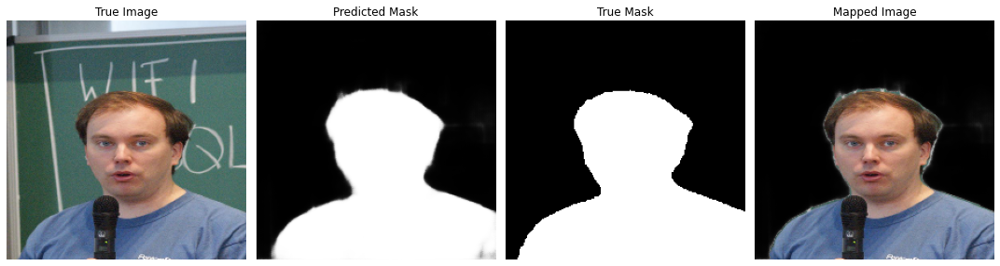

Epoch 34/100
32/32 [==============================] - 5s 143ms/step - loss: 0.0645 - accuracy: 0.9771 - IoU: 0.2199 - val_loss: 0.1530 - val_accuracy: 0.9568 - val_IoU: 0.2181


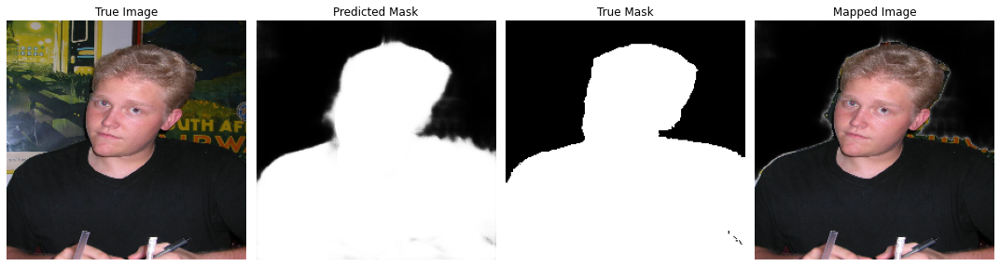

Epoch 35/100
32/32 [==============================] - 5s 161ms/step - loss: 0.0679 - accuracy: 0.9758 - IoU: 0.2196 - val_loss: 0.1740 - val_accuracy: 0.9562 - val_IoU: 0.2181


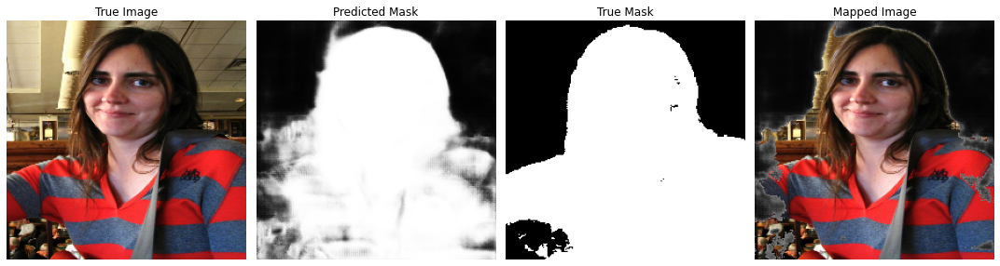

In [22]:
with tf.device('/GPU:0'):
    IMAGE_SIZE = 224

    # Input Layer 
    input_layer = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

    # Encoder
    p1, c1 = EncoderLayerBlock(16,0.1)(input_layer)
    p2, c2 = EncoderLayerBlock(32,0.1)(p1)
    p3, c3 = EncoderLayerBlock(32,0.1)(p2)
    p4, c4 = EncoderLayerBlock(64,0.1)(p3)

    # Encoding Layer
    c5 = EncoderLayerBlock(128,0.2,pooling=False)(p4)

    # Decoder
    d1 = DecoderLayerBlock(64,0.1)([c5, c4])
    d2 = DecoderLayerBlock(32,0.1)([d1, c3])
    d3 = DecoderLayerBlock(32,0.1)([d2, c2])
    d4 = DecoderLayerBlock(16,0.1)([d3, c1])

    # Output layer
    output = Conv2D(1,kernel_size=1,strides=1,padding='same',activation='sigmoid')(d4)

    # U-Net Model
    model = keras.models.Model(
        inputs=[input_layer],
        outputs=[output],
    )

    # Compile
    model.compile(
        loss='binary_crossentropy',
        optimizer='adam',
        metrics=['accuracy',keras.metrics.MeanIoU(num_classes=2,name='IoU')]
    )

    # Callbacks 
    callbacks = [
        EarlyStopping(patience=5,monitor='val_loss', mode='min',restore_best_weights=True),
        ModelCheckpoint("UNet-BG-Remover.h5", save_best_only=True),
        ShowProgress()
    ]

    model.fit(
        X_train, y_train,
        epochs=100,
        callbacks=callbacks,
        validation_data=(X_valid, y_valid)
    )

$Observations :$

* The model started to **predict the mask correctly after 13 epochs.**(Tried without early stopping.)

* Four images in which the **background is extremely clear** and the **subject does not take's up the whole image** the model was able to **predict almost perfect mask**.

* Even better mask were produced when the **background of the real images was of a single shade**.

* Changing up the threshold value that I used for image mapping will obviously change the final results, but **I found 0.1 to works best**. Sometimes 0.3 and 0.4 produced much better results, but overall 0.1 works.

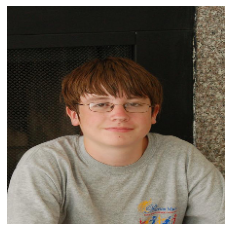

In [23]:
image = images[3]
ShowImage(image)

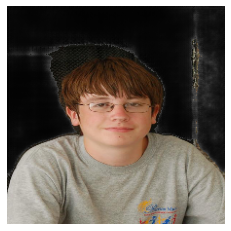

In [24]:
pred_mask = map(image,model.predict(image[np.newaxis,...])[0],0.3)
ShowImage(pred_mask,cmap='gray')

# **Testing Model**

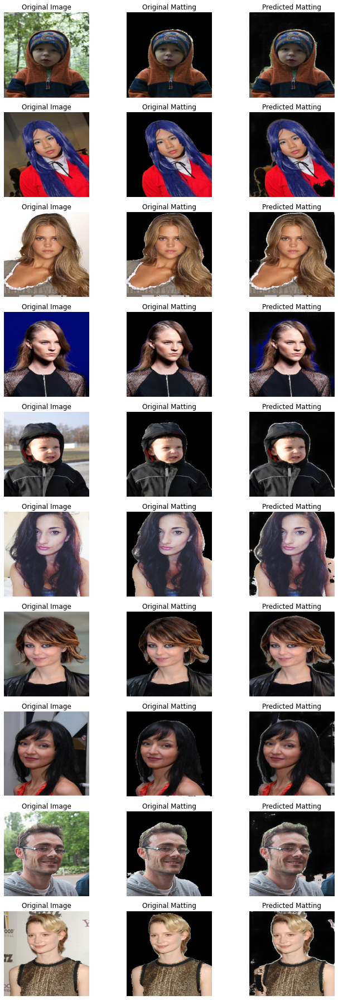

In [35]:
images, mattings, _ = data_loader(image_df, matting_df, BATCH_SIZE=10, IMAGE_SIZE=224)
n=0
k=0
plt.figure(figsize=(10,25))
for i in range(1,31):
    plt.subplot(10,3,i)
    
    if n==0:
        image = images[k]
        matting = mattings[k]
        pred_mat = map(image, model.predict(image[np.newaxis,...]),0.1)
        ShowImage(image, title="Original Image")
        n+=1
        k+=1
        
    elif n==1:
        ShowImage(matting,title="Original Matting")
        n+=1
    elif n==2:
        ShowImage(pred_mat[0], title="Predicted Matting")
        n=0
plt.tight_layout()
plt.show()

The results are **awesome** and **the model** is able to **detect all** the **person almost perfectly**. I am saying almost perfectly because **the model still fails** to **identify person when there is an small object behind or in front of them**. But I am fully satisfied with the images the model produces. 

---
**Thank you!!**. Please let me know your suggestions in the comments. They helped me to improve, get better and produce much better notebooks.


---
$Query :$
Is something wrong with my **mean intersection over union?** Because it doesn't seems to improve even if the masking is getting better and better.

---

**The model weights are available in my custom data set.**

---